In [ ]:
!pip install glob2

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 645.2/645.2 kB 10.8 MB/s eta 0:00:00


In [ ]:
!pip install roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.3/63.3 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 20.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.2/72.2 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.5 MB/s eta 0:00:00
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
      Successfully uninstalled pyparsing-3.1.1
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.8.1.78
    Uninstalling opencv-python-headless-4.8.1.78:
      Successfully uninstalled opencv-python-headless-4.8.1.78
  Attempting uninstall: idna
    Found existing

In [ ]:
import zipfile
import requests
import cv2
import matplotlib.pyplot as plt
import glob
import random
import os

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="Bbv4SM2VBEh4qrQkJvyt")
project = rf.workspace("bm-qnfdv").project("potholedetection-hudkv")
dataset = project.version(9).download("yolov8")


loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.0.207, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to PotholeDetection-9 in yolov8:: 100%|██████████| 1546/1546 [00:00<00:00, 4772.86it/s]


In [ ]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

In [ ]:
def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # Denormalize the coordinates.
        xmin = int(x1*w)
        ymin = int(y1*h)
        xmax = int(x2*w)
        ymax = int(y2*h)

        thickness = max(2, int(w/275))

        cv2.rectangle(
            image,
            (xmin, ymin), (xmax, ymax),
            color=(0, 0, 255),
            thickness=thickness
        )
    return image

In [ ]:
# Function to plot images with the bounding boxes.
def plot(image_paths, label_paths, num_samples):
    all_images = []
    all_images.extend(glob.glob(image_paths+'/*.jpg'))
    all_images.extend(glob.glob(image_paths+'/*.JPG'))

    all_images.sort()

    num_images = len(all_images)

    plt.figure(figsize=(15, 12))
    for i in range(num_samples):
        j = random.randint(0,num_images-1)
        image_name = all_images[j]
        image_name = '.'.join(image_name.split(os.path.sep)[-1].split('.')[:-1])
        image = cv2.imread(all_images[j])
        with open(os.path.join(label_paths, image_name+'.txt'), 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label = label_line[0]
                bbox_string = label_line[2:]
                x_c, y_c, w, h = bbox_string.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
    plt.subplots_adjust(wspace=1)
    plt.tight_layout()
    plt.show()

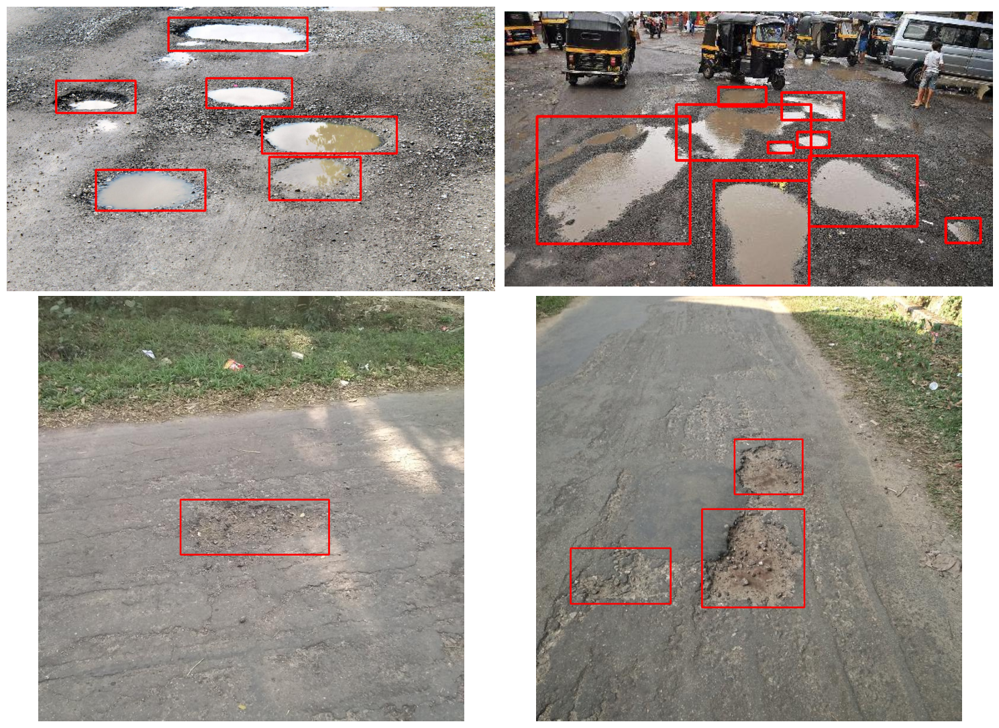

In [ ]:
plot(
    image_paths='/content/PotholeDetection-9/train/images',
    label_paths='/content/PotholeDetection-9/train/labels',
    num_samples=4,
)

In [ ]:
%%writefile pothole_v8.yaml
path: '/content/PotholeDetection-9'
train: '/content/PotholeDetection-9/train/images'
val: '/content/PotholeDetection-9/valid/images'

# class names
names:
  0: 'pothole'

Writing pothole_v8.yaml


In [ ]:
# Sample training for 5 epoch.
EPOCHS = 5
!yolo task=detect mode=train model=yolov8n.pt imgsz=1280 data=pothole_v8.yaml epochs={EPOCHS} batch=8 name=/content/drive/MyDrive/yolov8n_v8_50e

100% 6.23M/6.23M [00:00<00:00, 77.7MB/s]
Ultralytics YOLOv8.0.207 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=pothole_v8.yaml, epochs=5, patience=50, batch=8, imgsz=1280, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8n_v8_50e2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True

In [ ]:
!yolo task=detect mode=val model=/content/drive/MyDrive/yolov8n_v8_50e/weights/best.pt name=yolov8n_eval data=pothole_v8.yaml

WARNING ⚠️ /content/drive/MyDrive/yolov8n_v8_50e/weights/best.pt appears to require 'omegaconf', which is not in ultralytics requirements.
AutoInstall will run now for 'omegaconf' but this feature will be removed in the future.
Recommend fixes are to train a new model using the latest 'ultralytics' package or to run a command with an official YOLOv8 model, i.e. 'yolo predict model=yolov8n.pt'
requirements: Ultralytics requirement ['omegaconf'] not found, attempting AutoUpdate...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 10.4 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.9.3-py3-none-any.whl size=144554 sha256=2758b416f80b9467fe41934ac87088727ca41e10879fc8badb239f4141a03d44
  Stored in directory: /tmp/pip-ephem-wheel-cache-ef1zvvrc/wheels/12

In [ ]:
!yolo task=detect \
mode=predict \
model=/content/drive/MyDrive/yolov8n_v8_50e/weights/best.pt \
source=/content/PotholeDetection-9/valid/images \
imgsz=1280 \
name=yolov8n_v8_50e_infer1280 \
hide_labels=True

WARNING ⚠️ 'hide_labels' is deprecated and will be removed in 'ultralytics 8.2' in the future. Please use 'show_labels' instead.
Ultralytics YOLOv8.0.207 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs

image 1/153 /content/PotholeDetection-9/valid/images/102_jpg.rf.fa694fbf79160d73a98934da7aa8f8a3.jpg: 864x1280 5 potholes, 209.2ms
image 2/153 /content/PotholeDetection-9/valid/images/106_jpg.rf.7626885e558f050a65a2352075defbc0.jpg: 736x1280 3 potholes, 194.9ms
image 3/153 /content/PotholeDetection-9/valid/images/107_jpg.rf.122654e82975b84b0db912f9a9ba9dd6.jpg: 768x1280 1 pothole, 115.7ms
image 4/153 /content/PotholeDetection-9/valid/images/114_jpg.rf.f2eacabb5cacd25fec0c4743009d6aee.jpg: 864x1280 5 potholes, 26.3ms
image 5/153 /content/PotholeDetection-9/valid/images/115_jpg.rf.27eb212bbe8733a7e8f6167f40d2525a.jpg: 960x1280 1 pothole, 98.9ms
image 6/153 /content/PotholeDetection-9/valid/images

In [ ]:
# Plot and visualize images in a 2x2 grid.
def visualize(result_dir, num_samples=4):
    """
    Function accepts a list of images and plots
    them in a 2x2 grid.
    """
    plt.figure(figsize=(20, 12))
    image_names = glob.glob(os.path.join(result_dir, '*.jpg'))
    random.shuffle(image_names)
    for i, image_name in enumerate(image_names):
        image = plt.imread(image_name)
        plt.subplot(2, 2, i+1)
        plt.imshow(image)
        plt.axis('off')
        if i == num_samples-1:
            break
    plt.tight_layout()
    plt.show()

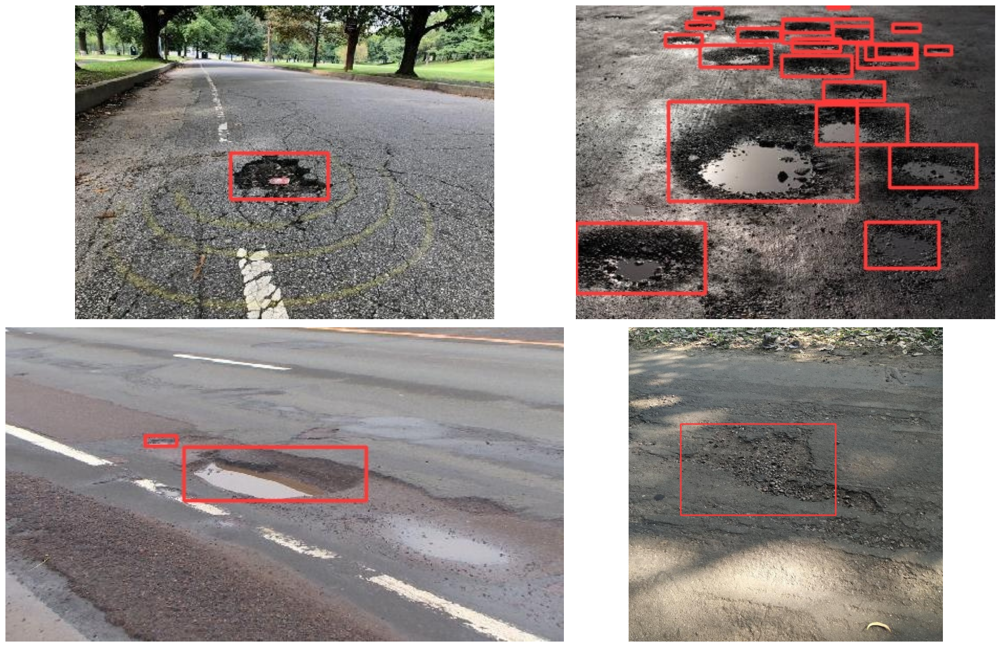

In [ ]:
visualize('/content/runs/detect/yolov8n_v8_50e_infer1280')

In [ ]:
!yolo task=detect \
mode=predict \
model=/content/drive/MyDrive/yolov8n_v8_50e/weights/best.pt \
source=/content/PotholeDetection-9/test/images \
imgsz=1280 \
name=yolov8n_v8_50e_infer1280_test \
hide_labels=True

WARNING ⚠️ 'hide_labels' is deprecated and will be removed in 'ultralytics 8.2' in the future. Please use 'show_labels' instead.
Ultralytics YOLOv8.0.207 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs

image 1/77 /content/PotholeDetection-9/test/images/10_jpg.rf.e22cd1708648d299964d37e2ae2d53a0.jpg: 736x1280 12 potholes, 174.7ms
image 2/77 /content/PotholeDetection-9/test/images/122_jpg.rf.54200947c45b61501fa7920d423df5ec.jpg: 864x1280 1 pothole, 87.4ms
image 3/77 /content/PotholeDetection-9/test/images/123_jpg.rf.7fc8d7c3e0997eda6926c8a1c94964c4.jpg: 960x1280 1 pothole, 95.6ms
image 4/77 /content/PotholeDetection-9/test/images/12_jpg.rf.a12ef3b9b98262852b5e80b7d05a6c0f.jpg: 928x1280 3 potholes, 104.6ms
image 5/77 /content/PotholeDetection-9/test/images/138_jpg.rf.4ded4d9e3eee046723f8f62cb8e5514a.jpg: 864x1280 3 potholes, 15.3ms
image 6/77 /content/PotholeDetection-9/test/images/141_jpg.rf.3f

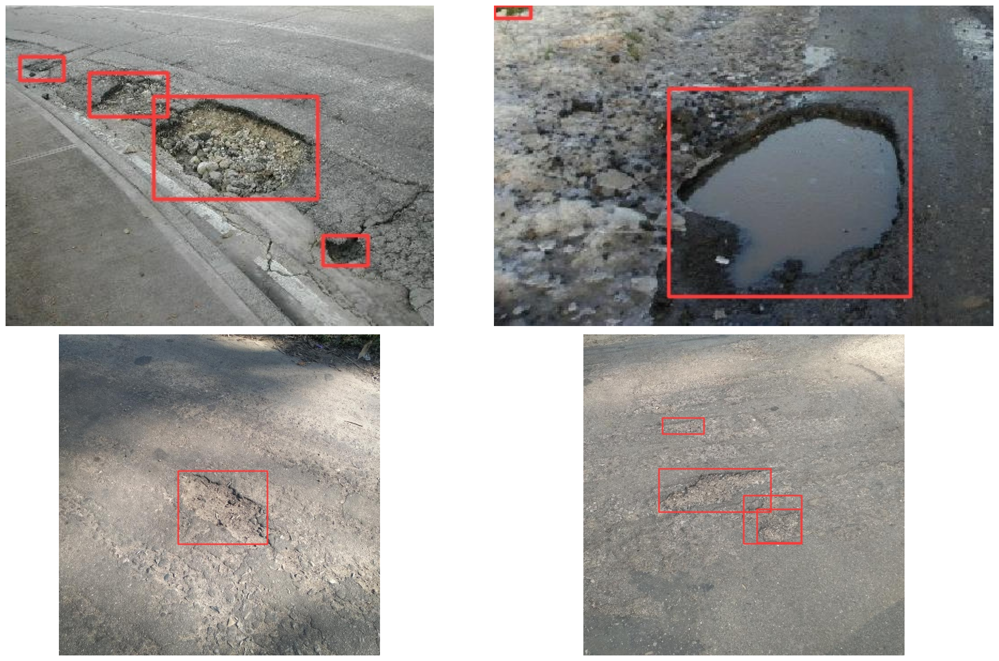

In [ ]:
visualize('/content/runs/detect/yolov8n_v8_50e_infer1280_test')